In [1]:
import json

In [2]:
with open('all_beauty.json') as user_file:
  file_contents = user_file.read()

{"overall": 5.0, "verified": true, "reviewTime": "09 1, 2016", "reviewerID": "A3CIUOJXQ5VDQ2", "asin": "B0000530HU", "style": {"Size:": " 7.0 oz", "Flavor:": " Classic Ice Blue"}, "reviewerName": "Shelly F", "reviewText": "As advertised. Reasonably priced", "summary": "Five Stars", "unixReviewTime": 1472688000}
{"overall": 5.0, "verified": true, "reviewTime": "11 14, 2013", "reviewerID": "A3H7T87S984REU", "asin": "B0000530HU", "style": {"Size:": " 7.0 oz", "Flavor:": " Classic Ice Blue"}, "reviewerName": "houserules18", "reviewText": "Like the oder and the feel when I put it on my face.  I have tried other brands but the reviews from people I know they prefer the oder of this brand. Not hard on the face when dry.  Does not leave dry skin.", "summary": "Good for the face", "unixReviewTime": 1384387200}
{"overall": 1.0, "verified": true, "reviewTime": "08 18, 2013", "reviewerID": "A3J034YH7UG4KT", "asin": "B0000530HU", "style": {"Size:": " 7.0 oz", "Flavor:": " Classic Ice Blue"}, "revie

In [3]:
from pandas import json_normalize
with open('all_beauty.json') as file:
    data = [json.loads(line) for line in file]
    
flat_data = json_normalize(data)

In [4]:
flat_data

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,style.Size:,style.Flavor:,vote,image,style.Color:,style.Scent Name:,style.Style Name:,style.Design:
0,5.0,True,"09 1, 2016",A3CIUOJXQ5VDQ2,B0000530HU,Shelly F,As advertised. Reasonably priced,Five Stars,1472688000,7.0 oz,Classic Ice Blue,NaN,NaN,NaN,NaN,NaN,NaN
1,5.0,True,"11 14, 2013",A3H7T87S984REU,B0000530HU,houserules18,Like the oder and the feel when I put it on my...,Good for the face,1384387200,7.0 oz,Classic Ice Blue,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,True,"08 18, 2013",A3J034YH7UG4KT,B0000530HU,Adam,I bought this to smell nice after I shave. Wh...,Smells awful,1376784000,7.0 oz,Classic Ice Blue,NaN,NaN,NaN,NaN,NaN,NaN
3,5.0,False,"05 3, 2011",A2UEO5XR3598GI,B0000530HU,Rich K,HEY!! I am an Aqua Velva Man and absolutely lo...,Truth is There IS Nothing Like an AQUA VELVA MAN.,1304380800,7.0 oz,Classic Ice Blue,25,NaN,NaN,NaN,NaN,NaN
4,5.0,True,"05 6, 2011",A3SFRT223XXWF7,B00006L9LC,C. C. Christian,If you ever want to feel pampered by a shampoo...,Bvlgari Shampoo,1304640000,200ml/6.7oz,NaN,3,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5264,5.0,True,"08 23, 2018",AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I have genetic undereye darkness. Ive accepted...,Pretty Sweet!!!,1534982400,NaN,NaN,2,NaN,NaN,NaN,NaN,ETA-C6B5F7C374
5265,5.0,True,"08 23, 2018",AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I absolutely love this eye gel.,As advertised,1534982400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ETA-7117EE3788
5266,5.0,True,"08 23, 2018",AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,The eye gel is easy to apply and I use it morn...,I'm very happy with,1534982400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ETA-BF66BD2F87
5267,5.0,True,"08 23, 2018",AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,Ok this eye gel is good stuff.,Does it's thing!,1534982400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ETA-03868FCB34


## Data Cleaning for Beauty Category

In [5]:
# Checking for missing values
missing_values = flat_data.isnull().sum()

print("Number of missing values in each column:")
print(missing_values)

Number of missing values in each column:
overall                 0
verified                0
reviewTime              0
reviewerID              0
asin                    0
reviewerName            0
reviewText              5
summary                 5
unixReviewTime          0
style.Size:           911
style.Flavor:        5257
vote                 4717
image                5171
style.Color:         4891
style.Scent Name:    5259
style.Style Name:    5229
style.Design:        5248
dtype: int64


In [6]:
# renaming column names
df = flat_data

new_column_names = ['overall', 'verified', 'reviewTime', 'reviewerID', 'productID', 
           'reviewerName', 'reviewText', 'summaryReviewText', 'unixReviewTime', 
           'size', 'flavor', 'vote', 'image', 'color', 'scent', 'style', 'design']
df.columns = new_column_names

In [7]:
# dropping columns with a lot of missing values
columns_to_drop = ['size', 'flavor', 'vote', 'image', 'color', 'scent', 'style', 'design']
df = df.drop(columns = columns_to_drop, axis=1)

In [8]:
# dropping all observations that have missing values in the reviewText column
columns_with_na_vals = ['reviewText', 'summaryReviewText']
df.dropna(subset = columns_with_na_vals, inplace=True)

In [9]:
# checking to make sure we have no more missing values
missing_vals = df.isnull().sum()
print("Number of missing values in each column:")
print(missing_vals)

Number of missing values in each column:
overall              0
verified             0
reviewTime           0
reviewerID           0
productID            0
reviewerName         0
reviewText           0
summaryReviewText    0
unixReviewTime       0
dtype: int64


In [10]:
# changing the reviewTime column to year
df['year'] = df['reviewTime'].astype(str).str[-4:]

In [11]:
# dropping reviewTime column
df = df.drop(columns = 'reviewTime', axis=1)

In [12]:
# dropping unixReviewTime column
df = df.drop(columns = 'unixReviewTime', axis=1)

In [13]:
df

,overall,verified,reviewerID,productID,reviewerName,reviewText,summaryReviewText,year
0,5.0,True,A3CIUOJXQ5VDQ2,B0000530HU,Shelly F,As advertised. Reasonably priced,Five Stars,2016
1,5.0,True,A3H7T87S984REU,B0000530HU,houserules18,Like the oder and the feel when I put it on my...,Good for the face,2013
2,1.0,True,A3J034YH7UG4KT,B0000530HU,Adam,I bought this to smell nice after I shave. Wh...,Smells awful,2013
3,5.0,False,A2UEO5XR3598GI,B0000530HU,Rich K,HEY!! I am an Aqua Velva Man and absolutely lo...,Truth is There IS Nothing Like an AQUA VELVA MAN.,2011
4,5.0,True,A3SFRT223XXWF7,B00006L9LC,C. C. Christian,If you ever want to feel pampered by a shampoo...,Bvlgari Shampoo,2011
...,...,...,...,...,...,...,...,...
5264,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I have genetic undereye darkness. Ive accepted...,Pretty Sweet!!!,2018
5265,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I absolutely love this eye gel.,As advertised,2018
5266,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,The eye gel is easy to apply and I use it morn...,I'm very happy with,2018
5267,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,Ok this eye gel is good stuff.,Does it's thing!,2018


## Preprocessing for Beauty Category

In [15]:
import nltk
from nltk.corpus import stopwords
import string

def preprocess_text(text):
    # Tokenization
    tokens = nltk.word_tokenize(text)
    
    # Lowercasing
    tokens = [token.lower() for token in tokens]
    
    # Removing stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]
    
    # Removing punctuation
    tokens = [token for token in tokens if token not in string.punctuation]
    
    return ' '.join(tokens)

df['processedReviewText'] = df['reviewText'].apply(preprocess_text)

print(df['processedReviewText'].head(20))


0                          advertised reasonably priced
1     like oder feel put face tried brands reviews p...
2     bought smell nice shave put smelled awful 19 s...
3     hey aqua velva man absolutely love stuff using...
4     ever want feel pampered shampoo one one smells...
5     know scent diva 'll love body cream .... every...
6     got shampoo solution wife 's dandruff problem ...
7     change scalp still itches like crazy doesnt la...
8     expensive poor quality improvement starting th...
9     dries hair doesnt help reduce dandruff use les...
10                      outstanding top organic shampoo
11    watered n't feel like actually shampoo tried t...
12    10 stars right product helped itchy skin siste...
13    first hair care product 've decided purchase o...
14              made dandruff worse irritated rest skin
15    worst shampoo ive ever used mostly water could...
16    made hair brittle dull looking n't anything it...
17    received shampoo suffering dandruff like o

In [16]:
import re
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

nltk.download('wordnet')
nltk.download('omw-1.4')

lemmatizer = WordNetLemmatizer()

# Function to expand common abbreviations
def expand_contractions(text):
    contractions = {
        "imo": "in my opinion", "lol": "laugh out loud",
        "idk": "I don't know", "btw": "by the way"
    }
    words = text.split()
    expanded_words = [contractions[word.lower()] if word.lower() in contractions else word for word in words]
    return ' '.join(expanded_words)

# Preprocessing function incorporating new steps
def preprocess_text(text):
    
    # Expand abbreviations
    text = expand_contractions(text)
    
    # Remove numbers
    text = re.sub(r'\d+', '', text)
    
    # Tokenization
    tokens = word_tokenize(text)
    
    # Lowercasing and 
    tokens = [lemmatizer.lemmatize(token.lower()) for token in tokens if token.lower() not in stopwords.words('english')]
    
    # Removing punctuation
    tokens = [token for token in tokens if token not in string.punctuation]
    
    return ' '.join(tokens)

# Example usage
df['processedReviewText'] = df['reviewText'].apply(preprocess_text)
print(df['processedReviewText'].head(20))


[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/anumdamani/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/anumdamani/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


0                          advertised reasonably priced
1     like oder feel put face tried brand review peo...
2     bought smell nice shave put smelled awful smel...
3     hey aqua velva man absolutely love stuff using...
4     ever want feel pampered shampoo one one smell ...
5     know scent diva 'll love body cream .... every...
6     got shampoo solution wife 's dandruff problem ...
7     change scalp still itch like crazy doesnt lath...
8     expensive poor quality improvement starting th...
9     dry hair doesnt help reduce dandruff use le sh...
10                      outstanding top organic shampoo
11    watered n't feel like actually shampoo tried t...
12    star right product helped itchy skin sister 's...
13    first hair care product 've decided purchase o...
14              made dandruff worse irritated rest skin
15    worst shampoo ive ever used mostly water could...
16    made hair brittle dull looking n't anything it...
17    received shampoo suffering dandruff like o

In [17]:
df

,overall,verified,reviewerID,productID,reviewerName,reviewText,summaryReviewText,year,processedReviewText
0,5.0,True,A3CIUOJXQ5VDQ2,B0000530HU,Shelly F,As advertised. Reasonably priced,Five Stars,2016,advertised reasonably priced
1,5.0,True,A3H7T87S984REU,B0000530HU,houserules18,Like the oder and the feel when I put it on my...,Good for the face,2013,like oder feel put face tried brand review peo...
2,1.0,True,A3J034YH7UG4KT,B0000530HU,Adam,I bought this to smell nice after I shave. Wh...,Smells awful,2013,bought smell nice shave put smelled awful smel...
3,5.0,False,A2UEO5XR3598GI,B0000530HU,Rich K,HEY!! I am an Aqua Velva Man and absolutely lo...,Truth is There IS Nothing Like an AQUA VELVA MAN.,2011,hey aqua velva man absolutely love stuff using...
4,5.0,True,A3SFRT223XXWF7,B00006L9LC,C. C. Christian,If you ever want to feel pampered by a shampoo...,Bvlgari Shampoo,2011,ever want feel pampered shampoo one one smell ...
...,...,...,...,...,...,...,...,...,...
5264,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I have genetic undereye darkness. Ive accepted...,Pretty Sweet!!!,2018,genetic undereye darkness ive accepted long ti...
5265,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I absolutely love this eye gel.,As advertised,2018,absolutely love eye gel
5266,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,The eye gel is easy to apply and I use it morn...,I'm very happy with,2018,eye gel easy apply use morning night cool touc...
5267,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,Ok this eye gel is good stuff.,Does it's thing!,2018,ok eye gel good stuff


In [18]:
from collections import Counter
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

all_words = ' '.join(df['processedReviewText']).split()
word_freq = Counter(all_words)

# Display the most common words
common_words = word_freq.most_common(50)
print(common_words)

[('product', 2020), ('love', 1742), ('hair', 1529), ('great', 1354), ("n't", 1339), ('smell', 1161), ("'s", 1122), ('like', 1098), ('use', 950), ('skin', 899), ('good', 882), ('scent', 834), ('shampoo', 824), ('one', 735), ('body', 729), ('soap', 649), ('get', 629), ('would', 603), ('using', 591), ('time', 588), ('make', 562), ('feel', 551), ('used', 543), ('wash', 536), ('find', 536), ('well', 513), ('year', 511), ('really', 505), ('shower', 492), ('fragrance', 483), ('clean', 469), ("''", 469), ('nice', 463), ('much', 433), ('work', 427), ('price', 418), ('also', 413), ('buy', 403), ('best', 398), ('dry', 384), ('favorite', 381), ('bottle', 364), ("'ve", 354), ('soft', 354), ('gel', 352), ('lotion', 324), ('long', 321), ('little', 315), ("'m", 311), ('conditioner', 306)]


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anumdamani/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [19]:
# Extend the NLTK stopwords list
extended_stopwords = stopwords.words('english') + ['product', 'use', 'one', 'also', 'really', 'used']

# Function to remove both general and sentiment-specific stopwords
def remove_stopwords(text):
    tokens = text.split()
    filtered_tokens = [token for token in tokens if token not in extended_stopwords]
    return ' '.join(filtered_tokens)

df['filteredReviewText'] = df['processedReviewText'].apply(remove_stopwords)
print(df['filteredReviewText'].head())

0                         advertised reasonably priced
1    like oder feel put face tried brand review peo...
2    bought smell nice shave put smelled awful smel...
3    hey aqua velva man absolutely love stuff using...
4    ever want feel pampered shampoo smell like won...
Name: filteredReviewText, dtype: object


In [21]:
# filtering on the verified column because we want to only look at verified reviews
verified_reviews = df[df['verified'] == True]
verified_reviews

,overall,verified,reviewerID,productID,reviewerName,reviewText,summaryReviewText,year,processedReviewText,filteredReviewText
0,5.0,True,A3CIUOJXQ5VDQ2,B0000530HU,Shelly F,As advertised. Reasonably priced,Five Stars,2016,advertised reasonably priced,advertised reasonably priced
1,5.0,True,A3H7T87S984REU,B0000530HU,houserules18,Like the oder and the feel when I put it on my...,Good for the face,2013,like oder feel put face tried brand review peo...,like oder feel put face tried brand review peo...
2,1.0,True,A3J034YH7UG4KT,B0000530HU,Adam,I bought this to smell nice after I shave. Wh...,Smells awful,2013,bought smell nice shave put smelled awful smel...,bought smell nice shave put smelled awful smel...
4,5.0,True,A3SFRT223XXWF7,B00006L9LC,C. C. Christian,If you ever want to feel pampered by a shampoo...,Bvlgari Shampoo,2011,ever want feel pampered shampoo one one smell ...,ever want feel pampered shampoo smell like won...
7,2.0,True,A24W4W9E62FZP2,B00006L9LC,Reb,No change my scalp still itches like crazy. It...,No change my scalp still itches like crazy. It...,2018,change scalp still itch like crazy doesnt lath...,change scalp still itch like crazy doesnt lath...
...,...,...,...,...,...,...,...,...,...,...
5264,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I have genetic undereye darkness. Ive accepted...,Pretty Sweet!!!,2018,genetic undereye darkness ive accepted long ti...,genetic undereye darkness ive accepted long ti...
5265,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I absolutely love this eye gel.,As advertised,2018,absolutely love eye gel,absolutely love eye gel
5266,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,The eye gel is easy to apply and I use it morn...,I'm very happy with,2018,eye gel easy apply use morning night cool touc...,eye gel easy apply morning night cool touch di...
5267,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,Ok this eye gel is good stuff.,Does it's thing!,2018,ok eye gel good stuff,ok eye gel good stuff


## Sentiment Analysis for Beauty Category

In [23]:
import pandas as pd
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/anumdamani/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [24]:
# Initialize the VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

In [25]:
# Function to assign sentiment labels
def get_sentiment_label(review):
    sentiment_scores = sid.polarity_scores(review)
    compound_score = sentiment_scores['compound']
    if compound_score >= 0.05:  # Adjust threshold as needed
        return 'positive'
    elif compound_score <= -0.05:  # Adjust threshold as needed
        return 'negative'
    else:
        return 'neutral'

In [26]:
verified_reviews

,overall,verified,reviewerID,productID,reviewerName,reviewText,summaryReviewText,year,processedReviewText,filteredReviewText
0,5.0,True,A3CIUOJXQ5VDQ2,B0000530HU,Shelly F,As advertised. Reasonably priced,Five Stars,2016,advertised reasonably priced,advertised reasonably priced
1,5.0,True,A3H7T87S984REU,B0000530HU,houserules18,Like the oder and the feel when I put it on my...,Good for the face,2013,like oder feel put face tried brand review peo...,like oder feel put face tried brand review peo...
2,1.0,True,A3J034YH7UG4KT,B0000530HU,Adam,I bought this to smell nice after I shave. Wh...,Smells awful,2013,bought smell nice shave put smelled awful smel...,bought smell nice shave put smelled awful smel...
4,5.0,True,A3SFRT223XXWF7,B00006L9LC,C. C. Christian,If you ever want to feel pampered by a shampoo...,Bvlgari Shampoo,2011,ever want feel pampered shampoo one one smell ...,ever want feel pampered shampoo smell like won...
7,2.0,True,A24W4W9E62FZP2,B00006L9LC,Reb,No change my scalp still itches like crazy. It...,No change my scalp still itches like crazy. It...,2018,change scalp still itch like crazy doesnt lath...,change scalp still itch like crazy doesnt lath...
...,...,...,...,...,...,...,...,...,...,...
5264,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I have genetic undereye darkness. Ive accepted...,Pretty Sweet!!!,2018,genetic undereye darkness ive accepted long ti...,genetic undereye darkness ive accepted long ti...
5265,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I absolutely love this eye gel.,As advertised,2018,absolutely love eye gel,absolutely love eye gel
5266,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,The eye gel is easy to apply and I use it morn...,I'm very happy with,2018,eye gel easy apply use morning night cool touc...,eye gel easy apply morning night cool touch di...
5267,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,Ok this eye gel is good stuff.,Does it's thing!,2018,ok eye gel good stuff,ok eye gel good stuff


In [27]:
# Apply sentiment analysis to each review
verified_reviews['sentiment'] = verified_reviews['filteredReviewText'].apply(get_sentiment_label)

/var/folders/nk/xkv_bvtx08jfbpgtwjq7tbdm0000gn/T/ipykernel_7176/2506074699.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  verified_reviews['sentiment'] = verified_reviews['filteredReviewText'].apply(get_sentiment_label)


In [28]:
# Filter positive and negative sentiment reviews
positive_reviews = verified_reviews[verified_reviews['sentiment'] == 'positive']['filteredReviewText']
negative_reviews = verified_reviews[verified_reviews['sentiment'] == 'negative']['filteredReviewText']

In [29]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [30]:
verified_reviews

,overall,verified,reviewerID,productID,reviewerName,reviewText,summaryReviewText,year,processedReviewText,filteredReviewText,sentiment
0,5.0,True,A3CIUOJXQ5VDQ2,B0000530HU,Shelly F,As advertised. Reasonably priced,Five Stars,2016,advertised reasonably priced,advertised reasonably priced,neutral
1,5.0,True,A3H7T87S984REU,B0000530HU,houserules18,Like the oder and the feel when I put it on my...,Good for the face,2013,like oder feel put face tried brand review peo...,like oder feel put face tried brand review peo...,positive
2,1.0,True,A3J034YH7UG4KT,B0000530HU,Adam,I bought this to smell nice after I shave. Wh...,Smells awful,2013,bought smell nice shave put smelled awful smel...,bought smell nice shave put smelled awful smel...,positive
4,5.0,True,A3SFRT223XXWF7,B00006L9LC,C. C. Christian,If you ever want to feel pampered by a shampoo...,Bvlgari Shampoo,2011,ever want feel pampered shampoo one one smell ...,ever want feel pampered shampoo smell like won...,positive
7,2.0,True,A24W4W9E62FZP2,B00006L9LC,Reb,No change my scalp still itches like crazy. It...,No change my scalp still itches like crazy. It...,2018,change scalp still itch like crazy doesnt lath...,change scalp still itch like crazy doesnt lath...,positive
...,...,...,...,...,...,...,...,...,...,...,...
5264,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I have genetic undereye darkness. Ive accepted...,Pretty Sweet!!!,2018,genetic undereye darkness ive accepted long ti...,genetic undereye darkness ive accepted long ti...,positive
5265,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I absolutely love this eye gel.,As advertised,2018,absolutely love eye gel,absolutely love eye gel,positive
5266,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,The eye gel is easy to apply and I use it morn...,I'm very happy with,2018,eye gel easy apply use morning night cool touc...,eye gel easy apply morning night cool touch di...,positive
5267,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,Ok this eye gel is good stuff.,Does it's thing!,2018,ok eye gel good stuff,ok eye gel good stuff,positive


### Making Positive & Negative Wordclouds for each year based on Trigrams

In [33]:
verified_reviews

,overall,verified,reviewerID,productID,reviewerName,reviewText,summaryReviewText,year,processedReviewText,filteredReviewText,sentiment
0,5.0,True,A3CIUOJXQ5VDQ2,B0000530HU,Shelly F,As advertised. Reasonably priced,Five Stars,2016,advertised reasonably priced,advertised reasonably priced,neutral
1,5.0,True,A3H7T87S984REU,B0000530HU,houserules18,Like the oder and the feel when I put it on my...,Good for the face,2013,like oder feel put face tried brand review peo...,like oder feel put face tried brand review peo...,positive
2,1.0,True,A3J034YH7UG4KT,B0000530HU,Adam,I bought this to smell nice after I shave. Wh...,Smells awful,2013,bought smell nice shave put smelled awful smel...,bought smell nice shave put smelled awful smel...,positive
4,5.0,True,A3SFRT223XXWF7,B00006L9LC,C. C. Christian,If you ever want to feel pampered by a shampoo...,Bvlgari Shampoo,2011,ever want feel pampered shampoo one one smell ...,ever want feel pampered shampoo smell like won...,positive
7,2.0,True,A24W4W9E62FZP2,B00006L9LC,Reb,No change my scalp still itches like crazy. It...,No change my scalp still itches like crazy. It...,2018,change scalp still itch like crazy doesnt lath...,change scalp still itch like crazy doesnt lath...,positive
...,...,...,...,...,...,...,...,...,...,...,...
5264,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I have genetic undereye darkness. Ive accepted...,Pretty Sweet!!!,2018,genetic undereye darkness ive accepted long ti...,genetic undereye darkness ive accepted long ti...,positive
5265,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I absolutely love this eye gel.,As advertised,2018,absolutely love eye gel,absolutely love eye gel,positive
5266,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,The eye gel is easy to apply and I use it morn...,I'm very happy with,2018,eye gel easy apply use morning night cool touc...,eye gel easy apply morning night cool touch di...,positive
5267,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,Ok this eye gel is good stuff.,Does it's thing!,2018,ok eye gel good stuff,ok eye gel good stuff,positive


In [34]:
# Function to extract unigrams and bigrams from text
from nltk.tokenize import word_tokenize
from nltk.util import ngrams

def extract_ngrams(text, n=3):
    tokens = word_tokenize(text)
    n_grams = ngrams(tokens, n)
    return [' '.join(grams) for grams in n_grams]

# Process both unigrams and bigrams
verified_reviews2 = verified_reviews.copy()
verified_reviews2['filteredReviewText_unigrams'] = verified_reviews['filteredReviewText'].apply(lambda x: ' '.join(word_tokenize(x)))
verified_reviews2['filteredReviewText_trigrams'] = verified_reviews['filteredReviewText'].apply(lambda x: ' '.join(extract_ngrams(x)))

# Apply sentiment analysis
verified_reviews2['sentiment_unigrams'] = verified_reviews2['filteredReviewText_unigrams'].apply(get_sentiment_label)
verified_reviews2['sentiment_trigrams'] = verified_reviews2['filteredReviewText_trigrams'].apply(get_sentiment_label)

In [35]:
verified_reviews2

,overall,verified,reviewerID,productID,reviewerName,reviewText,summaryReviewText,year,processedReviewText,filteredReviewText,sentiment,filteredReviewText_unigrams,filteredReviewText_trigrams,sentiment_unigrams,sentiment_trigrams
0,5.0,True,A3CIUOJXQ5VDQ2,B0000530HU,Shelly F,As advertised. Reasonably priced,Five Stars,2016,advertised reasonably priced,advertised reasonably priced,neutral,advertised reasonably priced,advertised reasonably priced,neutral,neutral
1,5.0,True,A3H7T87S984REU,B0000530HU,houserules18,Like the oder and the feel when I put it on my...,Good for the face,2013,like oder feel put face tried brand review peo...,like oder feel put face tried brand review peo...,positive,like oder feel put face tried brand review peo...,like oder feel oder feel put feel put face put...,positive,negative
2,1.0,True,A3J034YH7UG4KT,B0000530HU,Adam,I bought this to smell nice after I shave. Wh...,Smells awful,2013,bought smell nice shave put smelled awful smel...,bought smell nice shave put smelled awful smel...,positive,bought smell nice shave put smelled awful smel...,bought smell nice smell nice shave nice shave ...,positive,positive
4,5.0,True,A3SFRT223XXWF7,B00006L9LC,C. C. Christian,If you ever want to feel pampered by a shampoo...,Bvlgari Shampoo,2011,ever want feel pampered shampoo one one smell ...,ever want feel pampered shampoo smell like won...,positive,ever want feel pampered shampoo smell like won...,ever want feel want feel pampered feel pampere...,positive,positive
7,2.0,True,A24W4W9E62FZP2,B00006L9LC,Reb,No change my scalp still itches like crazy. It...,No change my scalp still itches like crazy. It...,2018,change scalp still itch like crazy doesnt lath...,change scalp still itch like crazy doesnt lath...,positive,change scalp still itch like crazy doesnt lath...,change scalp still scalp still itch still itch...,positive,positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5264,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I have genetic undereye darkness. Ive accepted...,Pretty Sweet!!!,2018,genetic undereye darkness ive accepted long ti...,genetic undereye darkness ive accepted long ti...,positive,genetic undereye darkness ive accepted long ti...,genetic undereye darkness undereye darkness iv...,positive,positive
5265,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,I absolutely love this eye gel.,As advertised,2018,absolutely love eye gel,absolutely love eye gel,positive,absolutely love eye gel,absolutely love eye love eye gel,positive,positive
5266,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,The eye gel is easy to apply and I use it morn...,I'm very happy with,2018,eye gel easy apply use morning night cool touc...,eye gel easy apply morning night cool touch di...,positive,eye gel easy apply morning night cool touch di...,eye gel easy gel easy apply easy apply morning...,positive,positive
5267,5.0,True,AUX122XW8ONG6,B01DLR9IDI,Amzon Customer,Ok this eye gel is good stuff.,Does it's thing!,2018,ok eye gel good stuff,ok eye gel good stuff,positive,ok eye gel good stuff,ok eye gel eye gel good gel good stuff,positive,positive


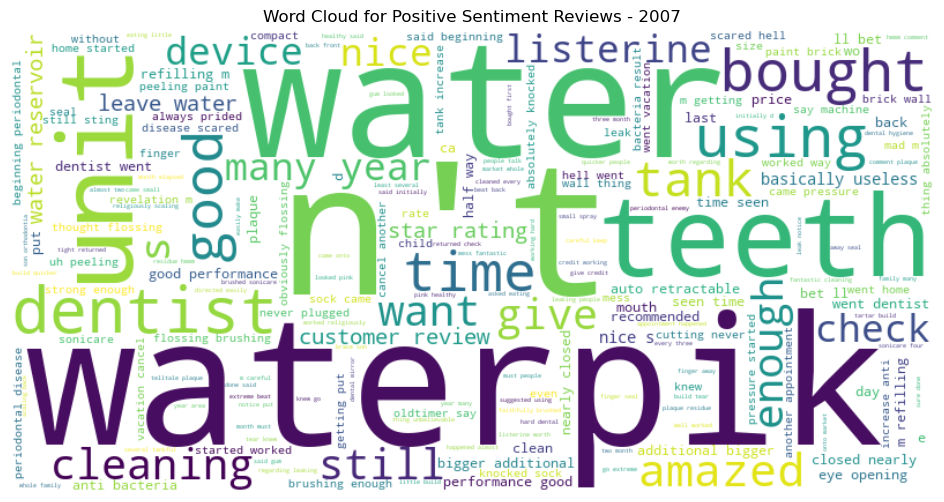

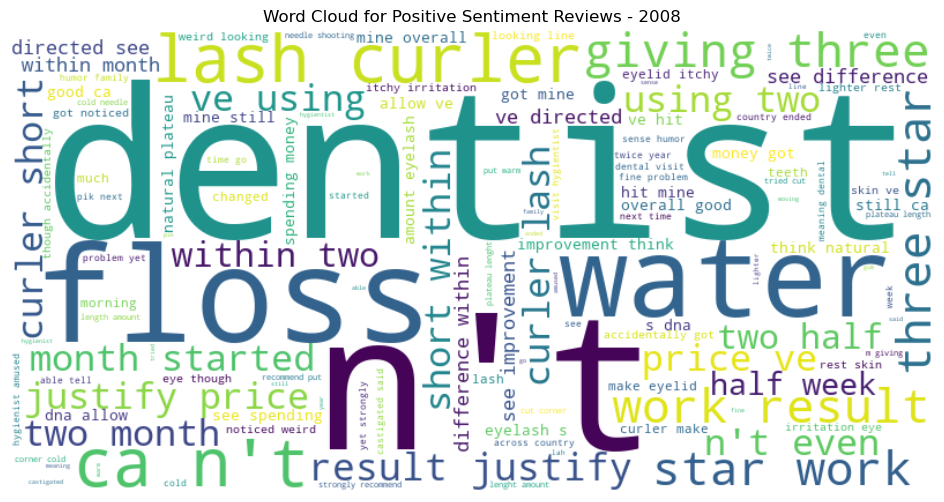

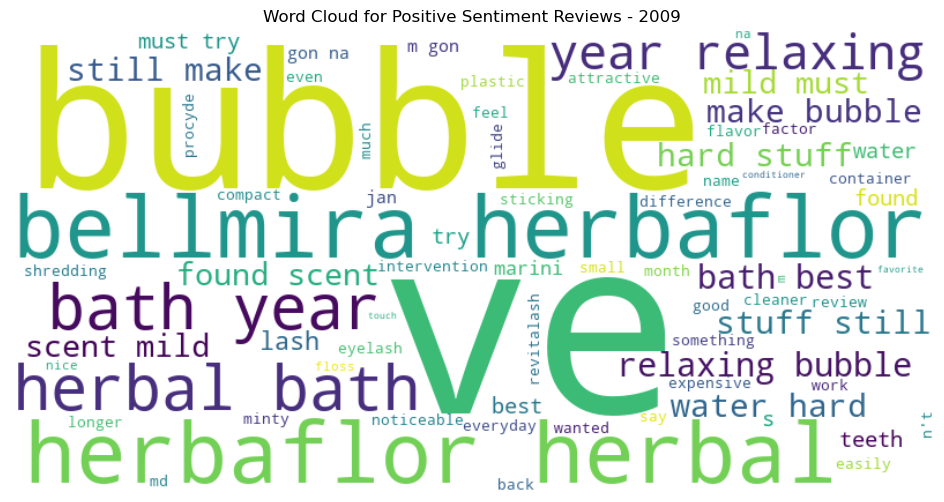

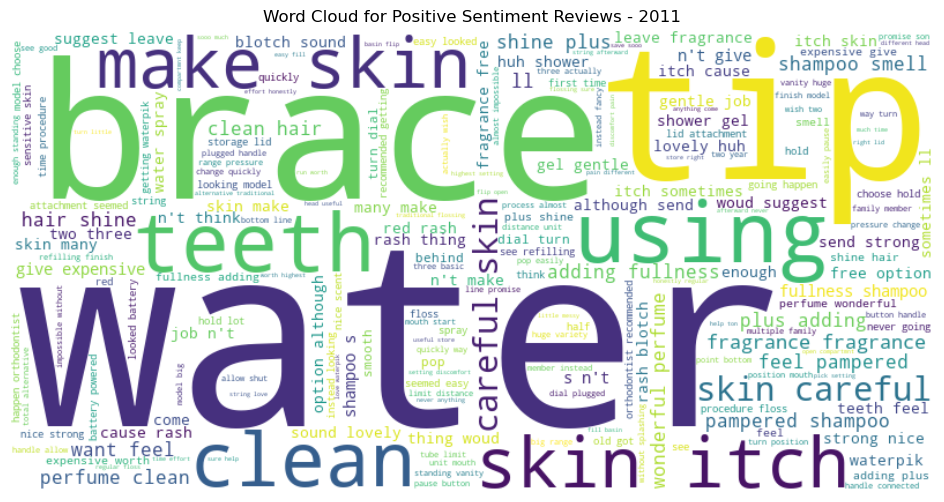

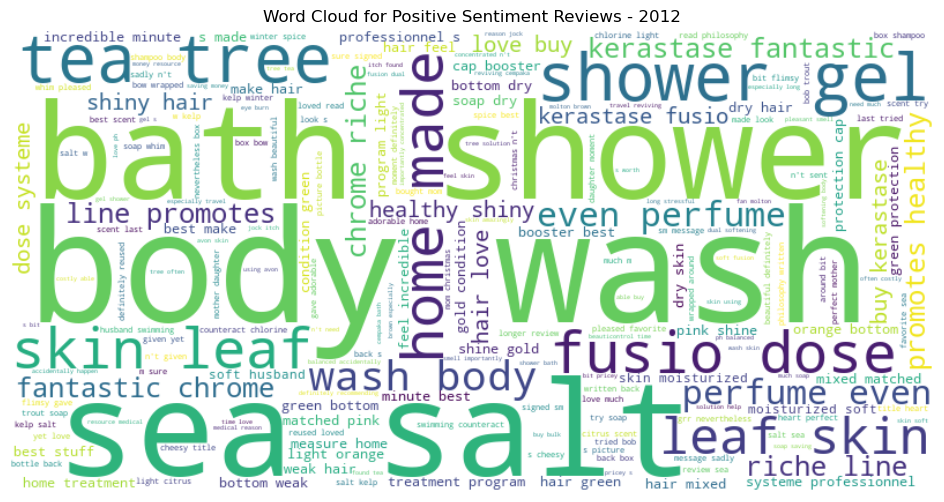

...

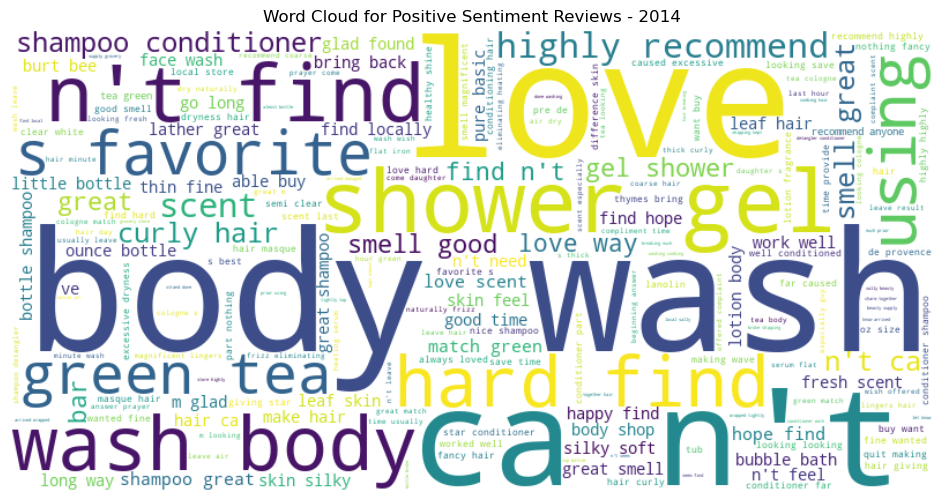

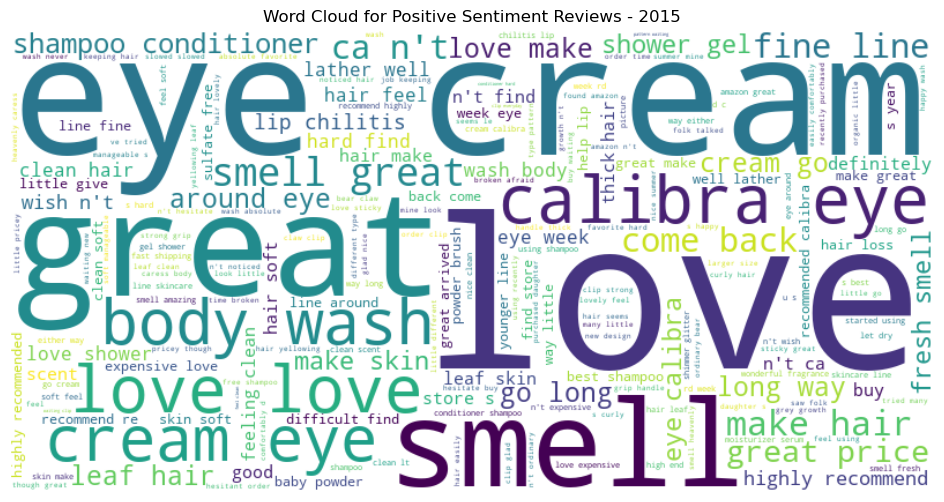

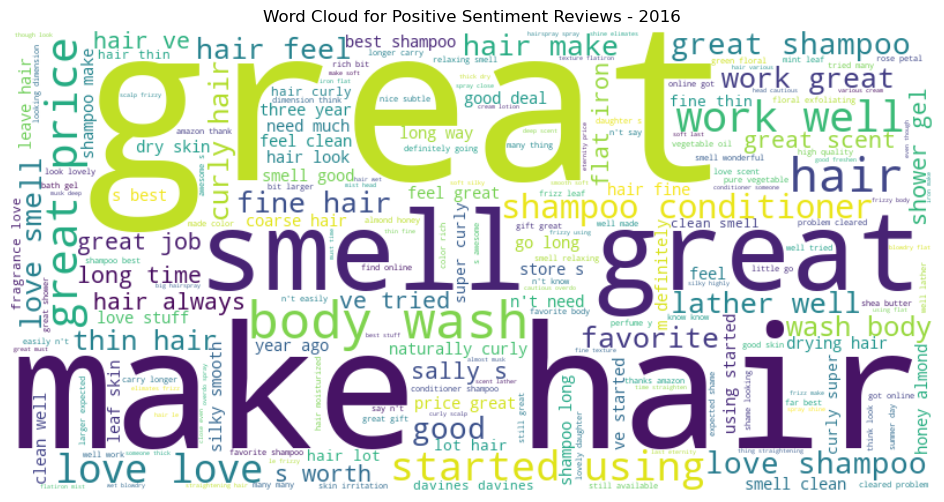

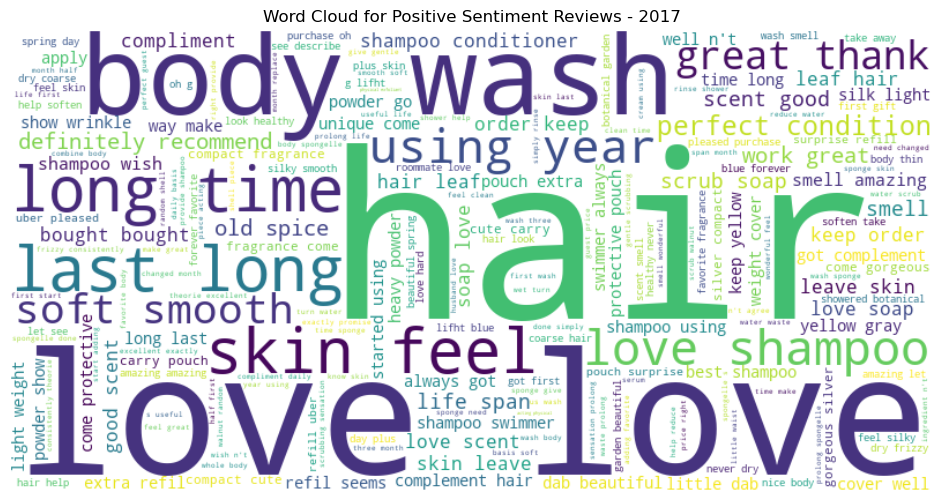

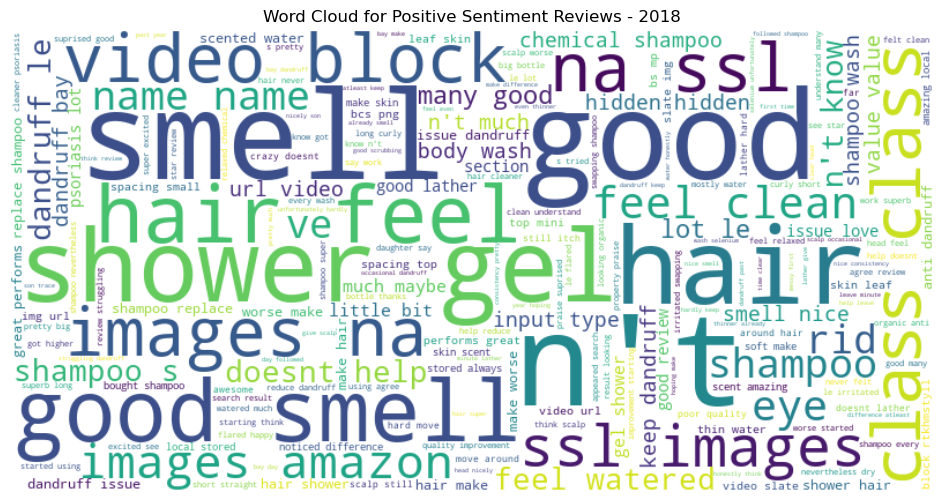

In [36]:
# MAKING THE POSITIVE WORDCLOUDS USING TRIGRAMS AND PRINTING THEM OUT


from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os

# Define directory to save images
#save_directory = os.path.expanduser('/Users/anumdamani/418project/positive_wordclouds_trigrams')

# Create directory if it doesn't exist
#os.makedirs(save_directory, exist_ok=True)

# store years
years = sorted(verified_reviews2['year'].unique())

for year in years:
    # Filtering positive and negative sentiment reviews for a year
    positive_reviews_year = verified_reviews2[(verified_reviews2['sentiment_trigrams'] == 'positive') & (verified_reviews['year'] == year)]['filteredReviewText_trigrams']
    
    # Checking if there are reviews available for a year
    if not positive_reviews_year.empty:
        # Creating wordcloud for positive sentiment reviews
        positive_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(positive_reviews_year))
        
        # Plotting wordcloud for positive sentiment reviews 
        plt.figure(figsize=(12, 6))
        plt.imshow(positive_wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for Positive Sentiment Reviews - {year}')
        plt.axis('off')
        # Saving the image
        #save_path = os.path.join(save_directory, f'positive_wordcloud_{year}.png')
        #plt.savefig(save_path)
        #plt.close()
        plt.show()

No negative reviews for the year 2007.
No negative reviews for the year 2008.
No negative reviews for the year 2009.


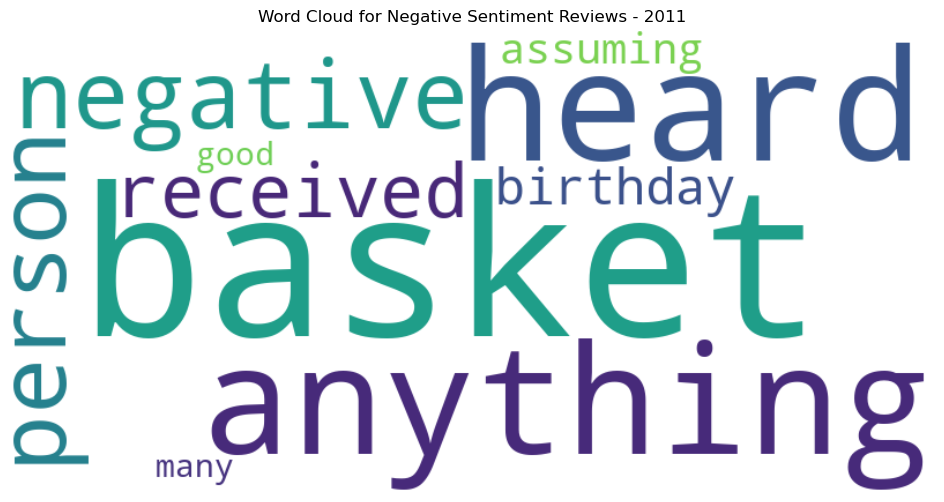

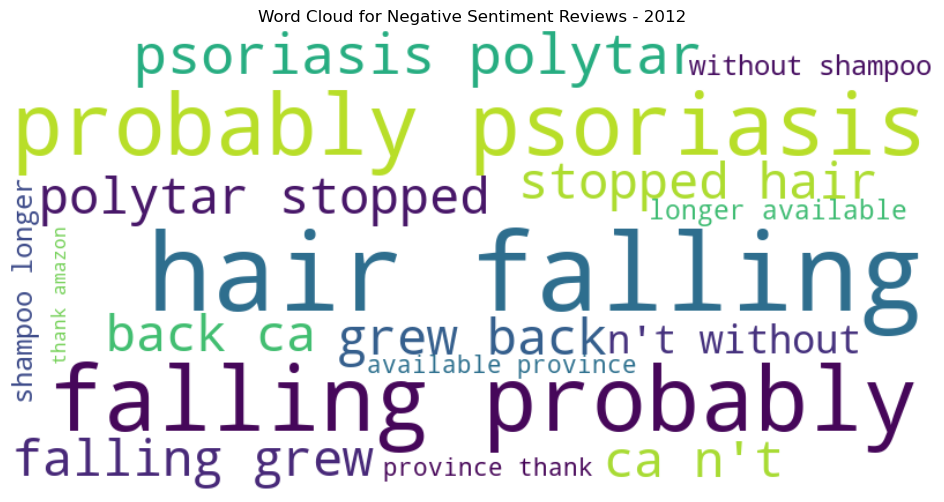

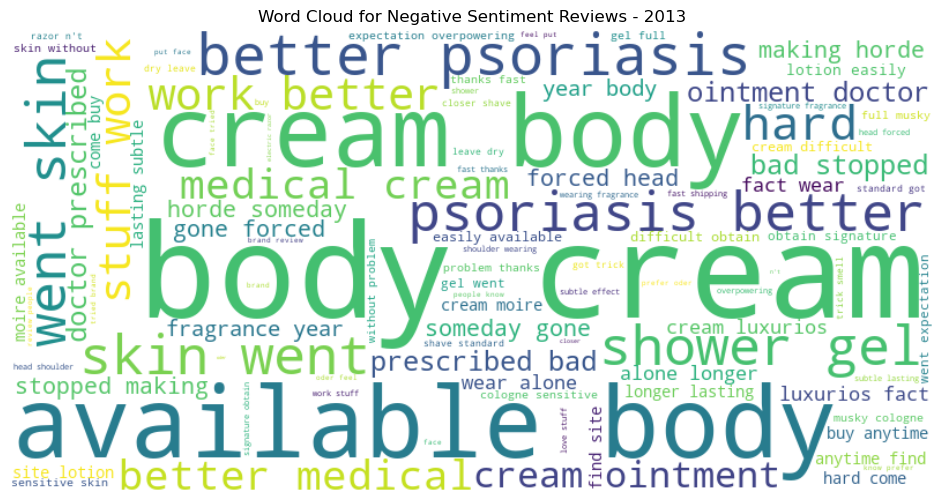

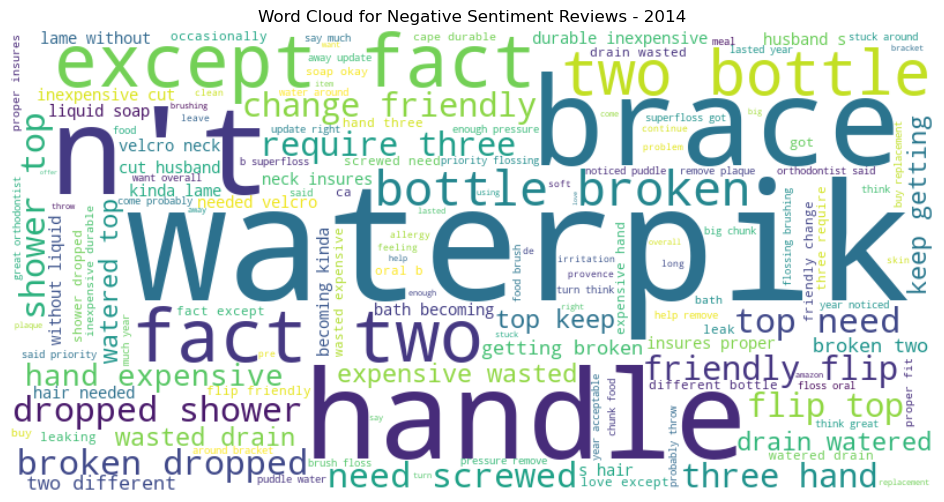

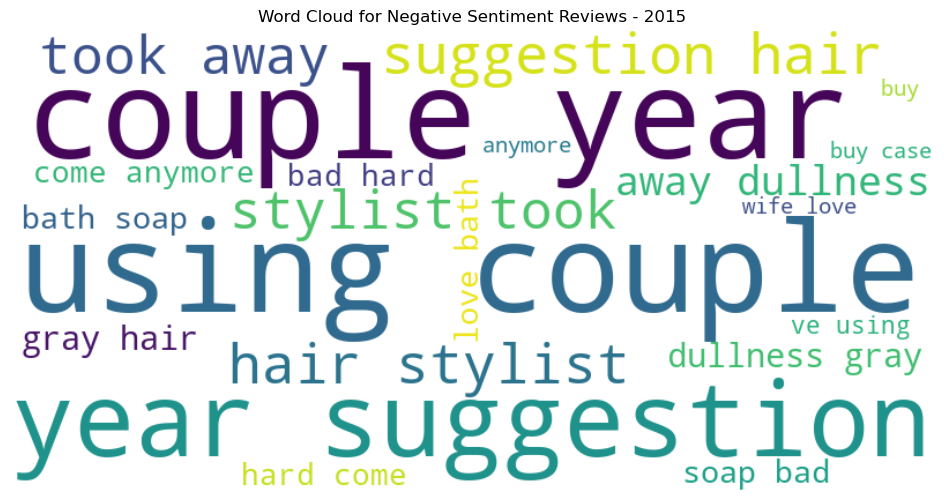

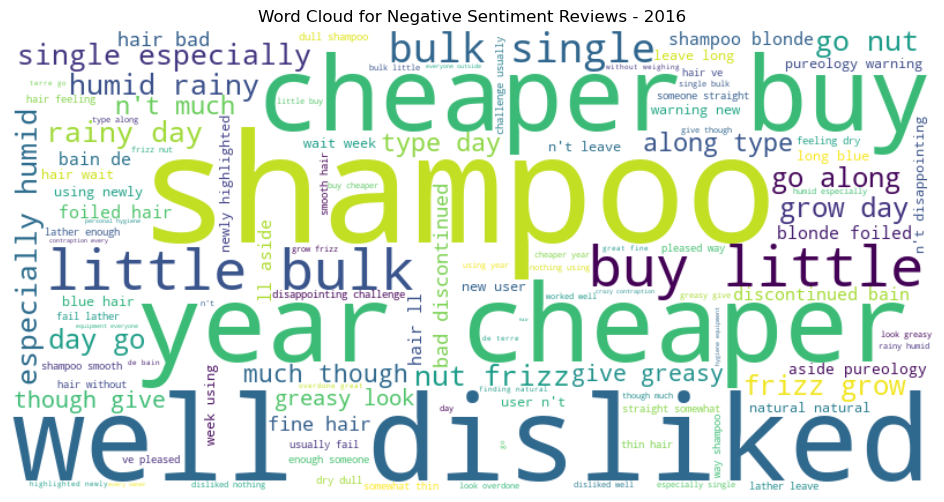

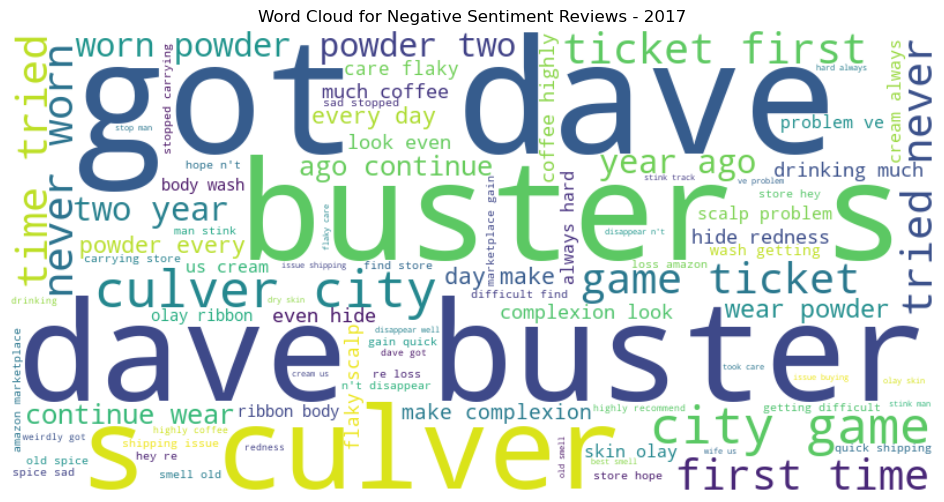

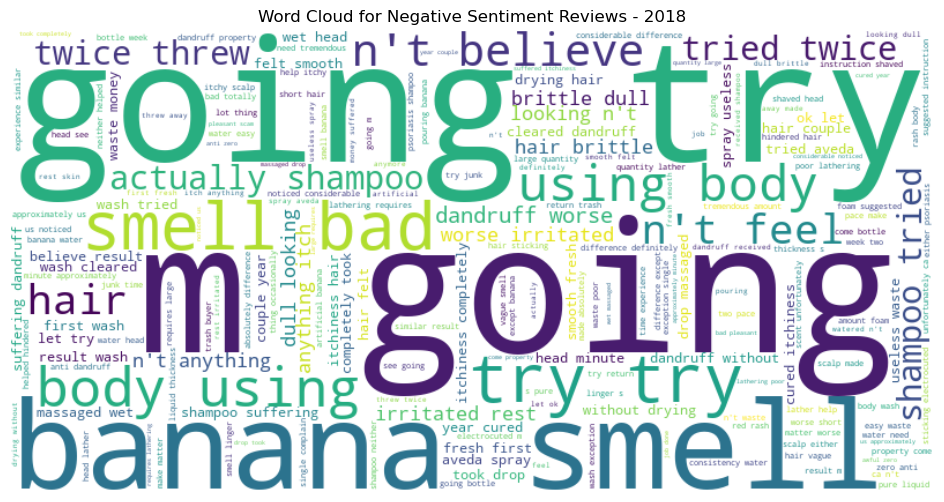

In [37]:
# MAKING NEGATIVE WORDCLOUDS USING TRIGRAMS AND PRINTING THEM OUT
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os

# Defining the directory to save images
#save_directory = os.path.expanduser('/Users/anumdamani/418project/negative_wordclouds_trigrams')

# Creating directory if it doesn't exist
#os.makedirs(save_directory, exist_ok=True)

# store years
years = sorted(verified_reviews2['year'].unique())

# Loop through each year
for year in years:
    # Filtering negative sentiment reviews for a year
    negative_reviews_year = verified_reviews2[(verified_reviews2['sentiment_trigrams'] == 'negative') & (verified_reviews['year'] == year)]['filteredReviewText_trigrams']
    
    # Checking if there are negative reviews available 
    if not negative_reviews_year.empty:
        # Creating wordcloud for negative sentiment reviews
        negative_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(negative_reviews_year))
        
        # Plotting wordcloud for negative sentiment reviews
        plt.figure(figsize=(12, 6))
        plt.imshow(negative_wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for Negative Sentiment Reviews - {year}')
        plt.axis('off')
        #save_path = os.path.join(save_directory, f'negative_wordcloud_{year}.png')
        #plt.savefig(save_path)
        #plt.close()
        plt.show()
    else:
        print(f"No negative reviews for the year {year}.")